In [99]:
from PIL import Image, ImageDraw
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

In [191]:
path = r'photo_5402620829310767557_x.jpg'
# path = r'a8bf809c-5526-41bc-817c-6a6b4c97c375.jpg'

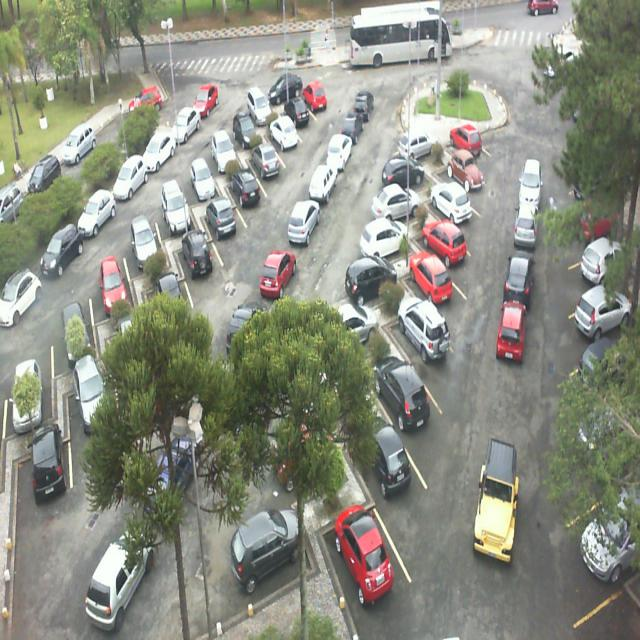

In [192]:
img = Image.open(path)
img

In [193]:
img.size

(640, 640)

In [194]:
import numpy as np

class line:
    def __init__(self, point1, point2, start_point=None):
        vect = np.array([point2[0] - point1[0], point2[1] - point1[1]])
        self.n = vect / np.linalg.norm(vect)
        if start_point == None:
            start_point = point1
        self.v0 = np.array([point1[0], point1[1]])

    def return_coords(self, x):
        return self.v0 + self.n * x

    def distance(self, coords):
        v1 = np.array([coords[0], coords[1]])
        return np.linalg.norm(v1-self.v0)

In [208]:
model = load_model('models/proposed_quantized.tflite')
labels = ['unoccupied', 'occupied']

OSError: Unable to synchronously open file (file signature not found)

In [196]:
def draw_rectangles(img, p1, p2, size, size_scale, n_cars, n):    
    l1 = line(p2, p1)
    total_dist = l1.distance(p1)

    draw = ImageDraw.Draw(img)
    a = (total_dist - (n_cars-1) * n) / np.sum(range(n_cars-1))
    distance = 0
    res = []
        
    for i in range(0, n_cars):
        #print(distance)
        x, y = l1.return_coords(distance)
        #print(x, y)
        x, y = int(x), int(y)
        new_size = int(size * size_scale**i)
        #new_size = size
        coords = (x, y, x+new_size, y+new_size)
        #print(new_size)
        cropped_img = img.crop(coords)
        crop_image_resized = cropped_img.resize((32,32))
        img_array = np.array(crop_image_resized).reshape(1, 32, 32, 3)
        # convert an object of Image into tensor to feed it to the model
        prediction = model.predict(img_array)
        predicted_class = np.argmax(prediction)
        # define result
        result = predicted_class
        
        if result > 0.5:
            draw.rectangle(coords, outline=(0,255,0))
        else:
            draw.rectangle(coords, outline=(255,0,0))
        
        distance += n + i * a    


### Drawing rectangles line by line

1/1 [==============================] - 0s 21ms/step


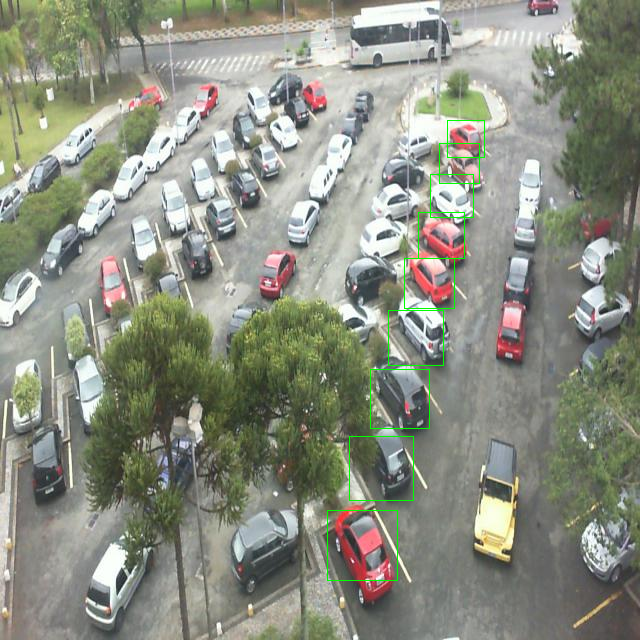

In [197]:
img = Image.open(path)

coords1 = (327, 510)
coords2 = (447, 120)
crop_images = draw_rectangles(img, coords1, coords2, size=37, size_scale=1.083, n_cars=9, n=25)

img

1/1 [==============================] - 0s 16ms/step


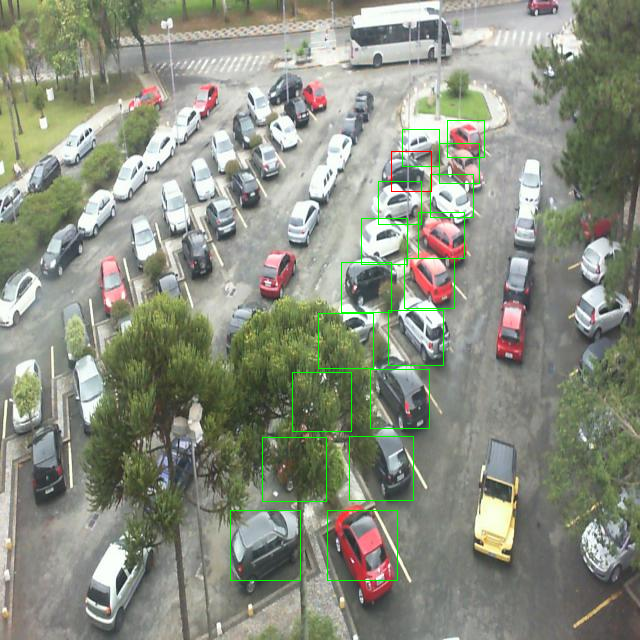

In [198]:
coords1 = (230, 510)
coords2 = (402, 129)

crop_images = draw_rectangles(img, coords1, coords2, size=37, size_scale=1.083, n_cars=9, n=25)

img

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 31ms/step


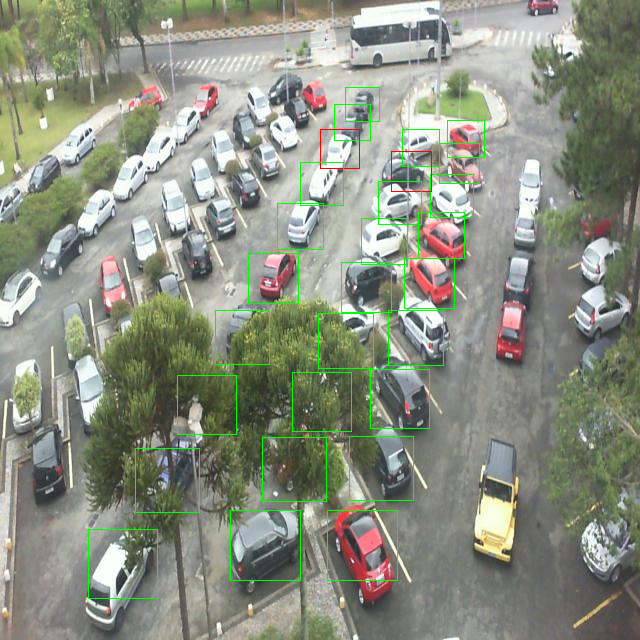

In [199]:
coords1 = (88, 529)
coords2 = (345, 87)

crop_images = draw_rectangles(img, coords1, coords2, size=34, size_scale=1.083, n_cars=10, n=20)

img

1/1 [==============================] - 0s 34ms/step


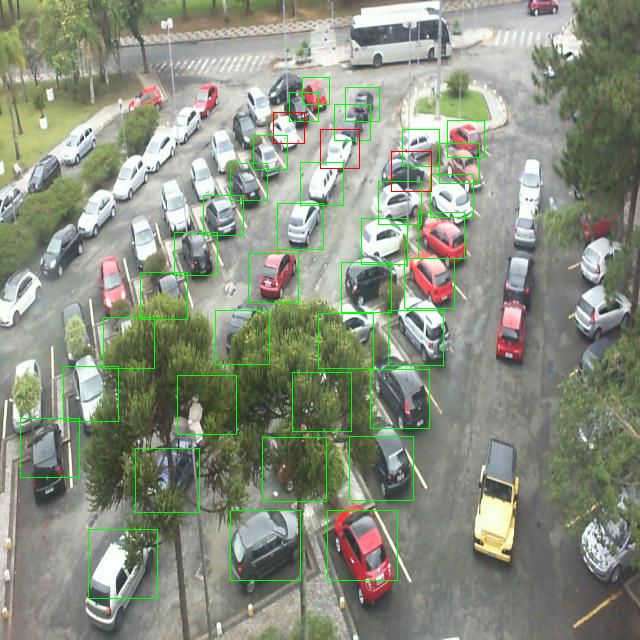

In [200]:
coords1 = (20, 419)
coords2 = (302, 77)

crop_images = draw_rectangles(img, coords1, coords2, size=27, size_scale=1.083, n_cars=11, n=20)

img

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 47ms/step


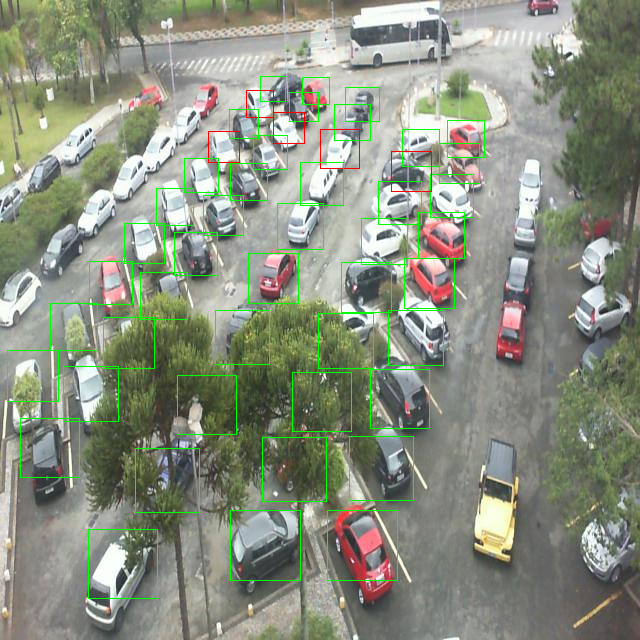

In [201]:
coords1 = (8, 350)
coords2 = (260, 76)

crop_images = draw_rectangles(img, coords1, coords2, size=25, size_scale=1.083, n_cars=10, n=20)

img

1/1 [==============================] - 0s 22ms/step


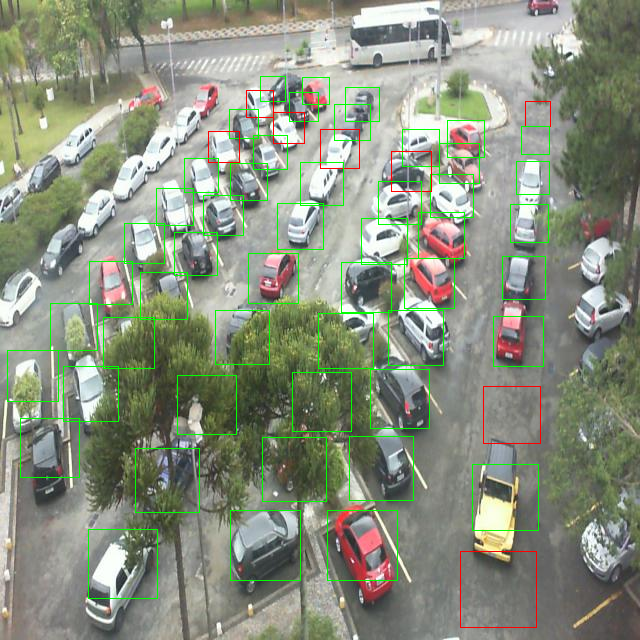

In [202]:
coords1 = (460, 551)
coords2 = (525, 101)

crop_images = draw_rectangles(img, coords1, coords2, size=25, size_scale=1.15, n_cars=9, n=26)

img

1/1 [==============================] - 0s 16ms/step


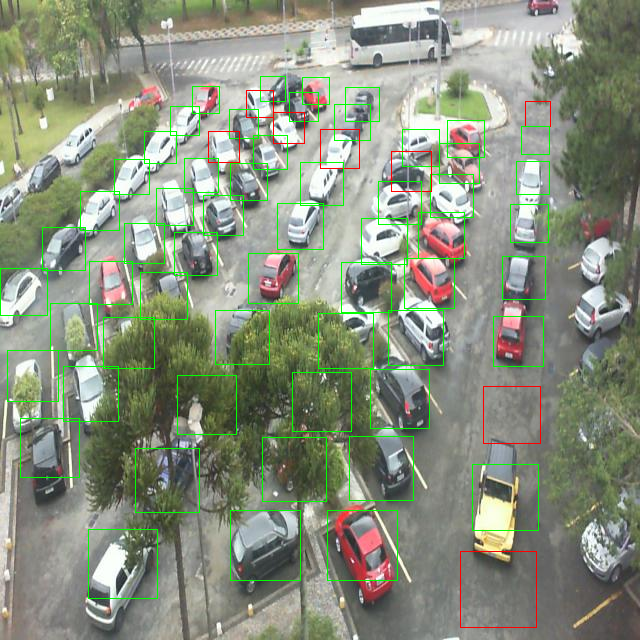

In [203]:
coords1 = (0, 268)
coords2 = (192, 86)

crop_images = draw_rectangles(img, coords1, coords2, size=27, size_scale=1.1, n_cars=7, n=30)

img

1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 15ms/step


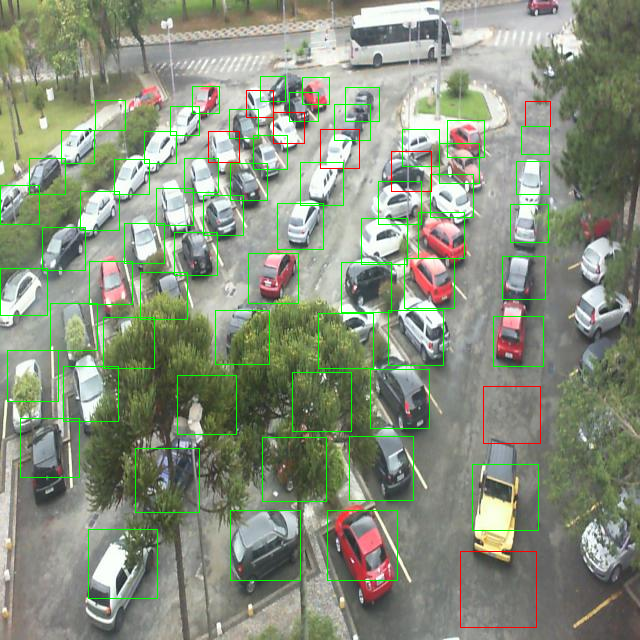

In [204]:
coords1 = (0, 185)
coords2 = (95, 100)

crop_images = draw_rectangles(img, coords1, coords2, size=30, size_scale=1.1, n_cars=4, n=45)

img

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 44ms/step


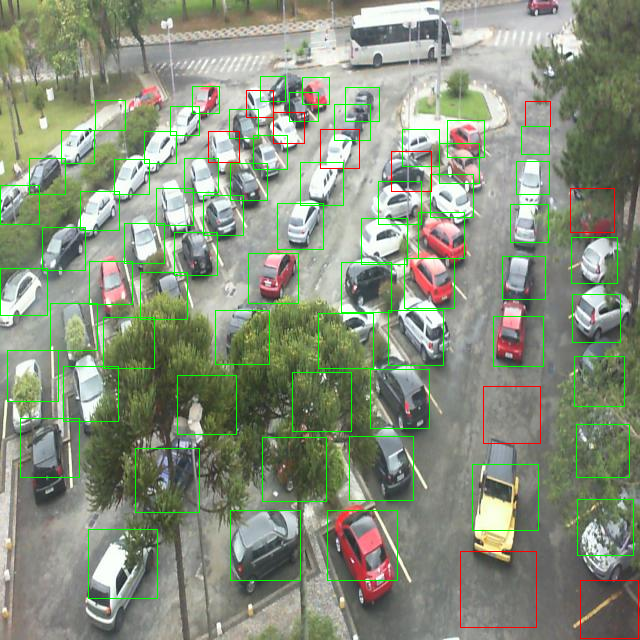

In [205]:
coords1 = (580, 580)
coords2 = (570, 188)

crop_images = draw_rectangles(img, coords1, coords2, size=44, size_scale=1.05, n_cars=7, n=50)

img

In [206]:
img.save('many_occupied_slots_proposed_quantized.png')